# Read Data and Show the K-line graph

In [1]:
import numpy as np
import pandas as pd
import collections
import datetime
from read_table import get_table

In [2]:
table = get_table()

In [3]:
table["1"]

,date,open,high,low,close,volume
0,2019/1/29,10.96,11.07,10.77,11.00,82663112
1,2019/1/30,10.95,11.18,10.86,10.95,71200104
2,2019/1/31,10.98,11.20,10.94,11.10,83162272
3,2019/2/1,11.20,11.25,10.96,11.20,101427008
4,2019/2/11,11.08,11.21,10.97,11.21,80193664
...,...,...,...,...,...,...
275,2020/3/20,12.40,12.68,12.26,12.52,157835296
276,2020/3/23,12.00,12.35,11.93,12.15,107111360
277,2020/3/24,12.40,12.68,12.27,12.61,118020024
278,2020/3/25,12.88,13.07,12.70,12.87,113695776


In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use("seaborn")

## Classis Line Chart

In [9]:
def print_line():
    for i in range(1, 11):
        opens = [q for q in table[str(i)]["open"]]
        high = [q for q in table[str(i)]["high"]]
        low = [q for q in table[str(i)]["low"]]
        close = [q for q in table[str(i)]["close"]]
        # turnover = [q/10000000 for q in table["1"]["turnover"]]
        dates = [datetime.datetime.strptime(q ,"%Y/%m/%d") for q in table[str(i)].date]

        fig = plt.figure(figsize=(20,10), dpi=300)
        ax = fig.add_subplot(111)
        ax.plot_date(dates, opens, color='b',linestyle='-',marker='o', label='open')
        ax.plot_date(dates, close, color='r',linestyle='-',marker='o', label='close')
        ax.plot_date(dates, high, color='g',linestyle='--',marker='v', label='high')
        ax.plot_date(dates, low, color='coral',linestyle='--',marker='v', label='low')
        # ax.plot_date(dates, turnover, color='black',linestyle='-',marker='.', label='volume')
        plt.title("")
        plt.legend()
        fig.autofmt_xdate() 
        plt.savefig("./lineCharts/"+str(i)+".png")
        plt.show()

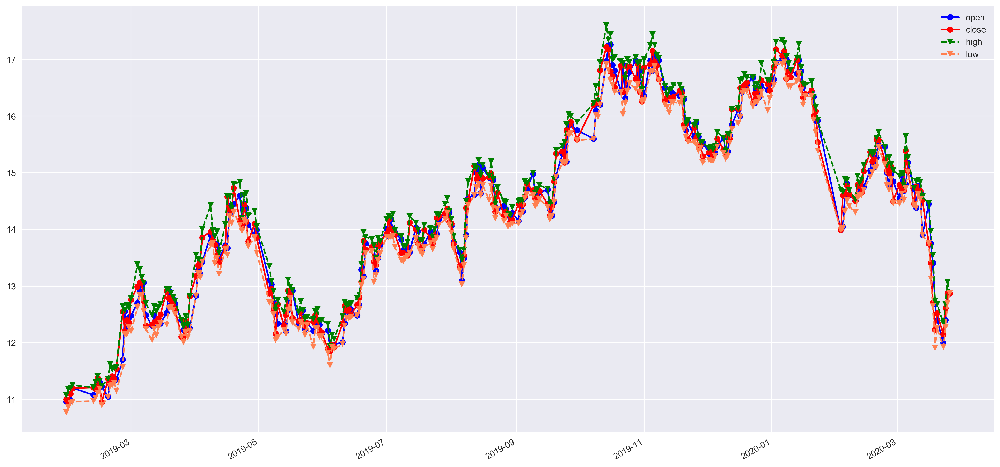

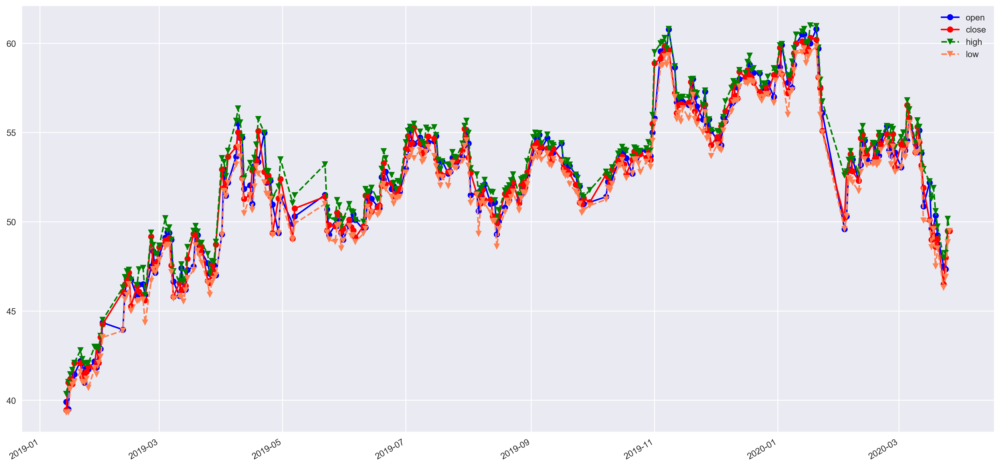

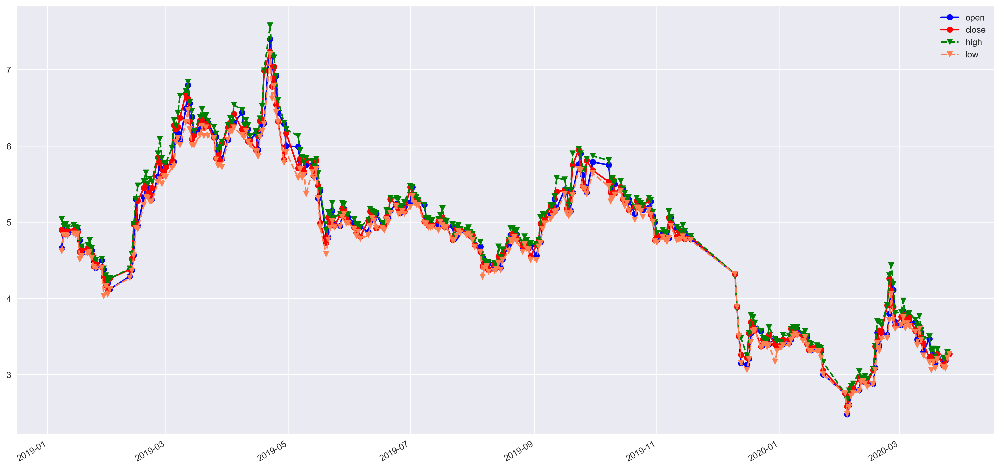

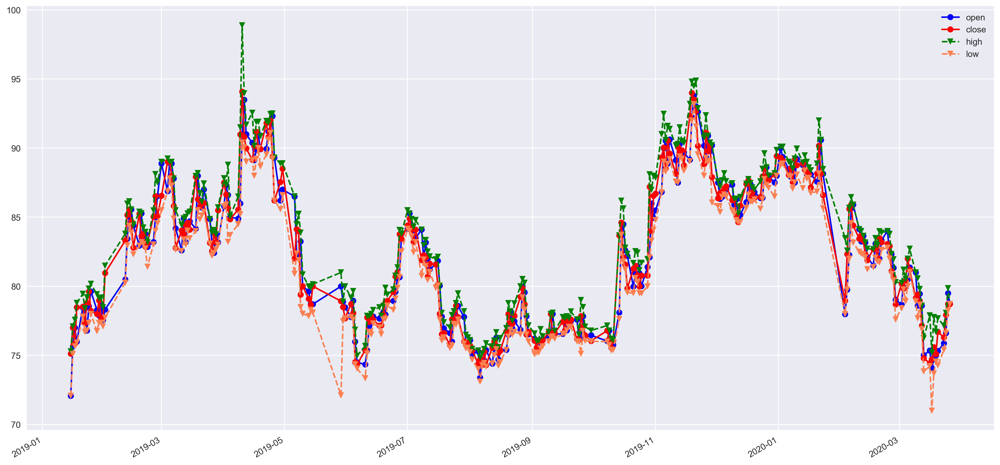

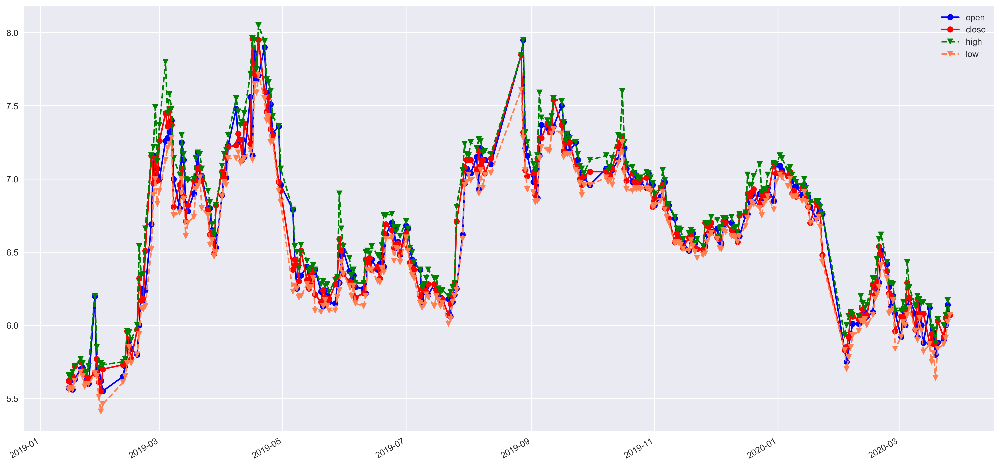

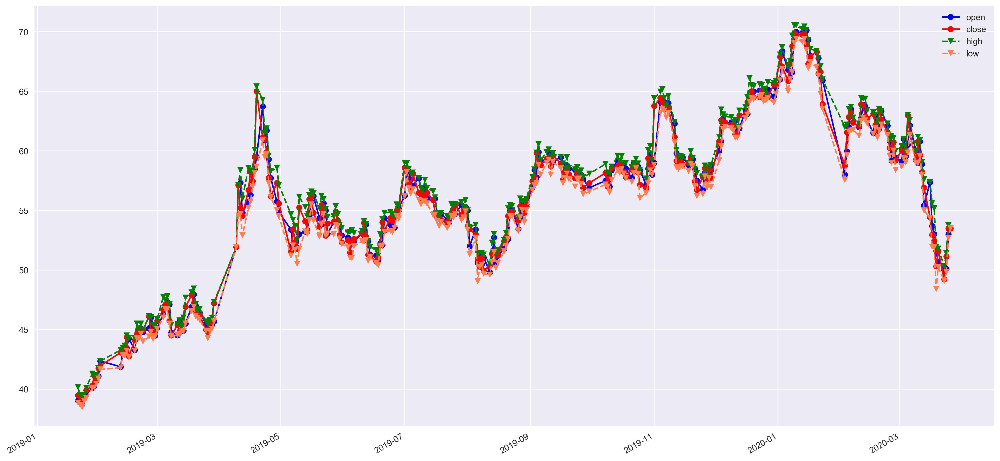

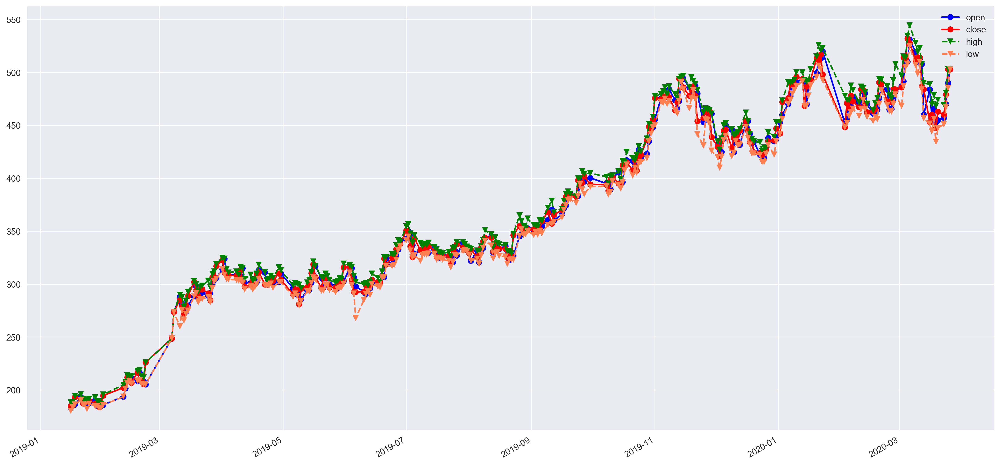

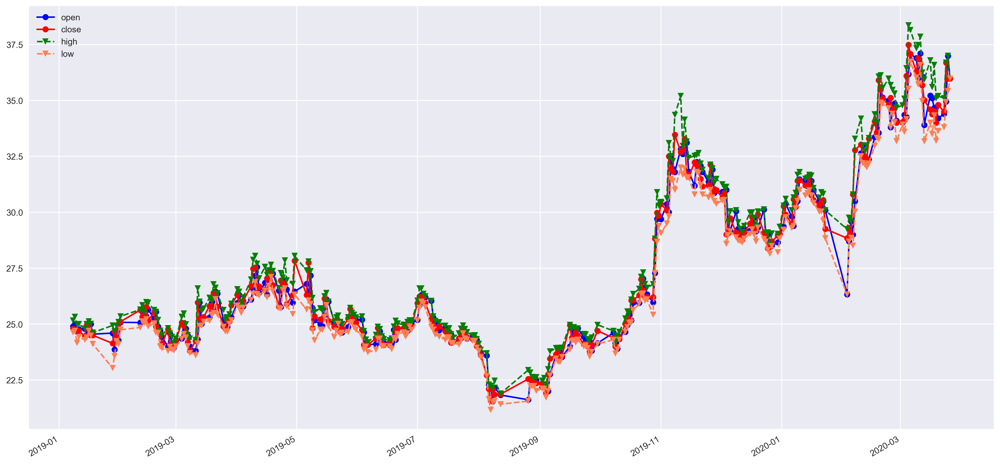

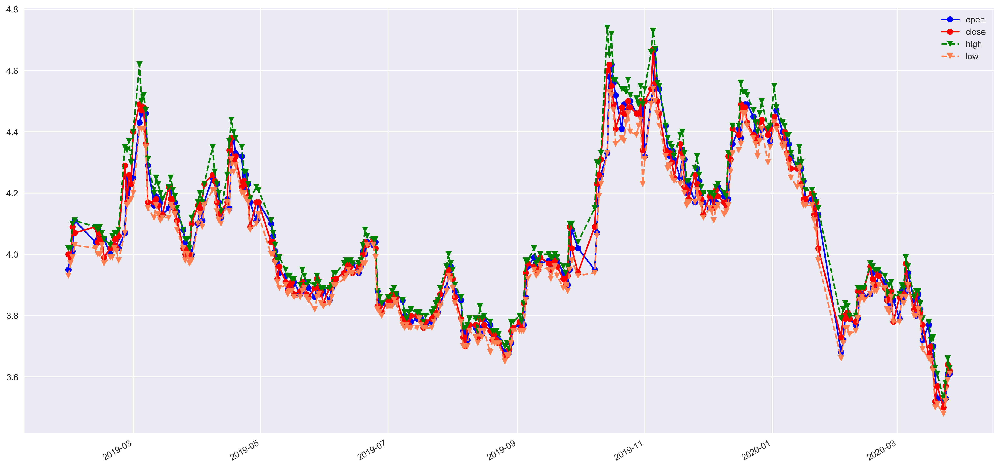

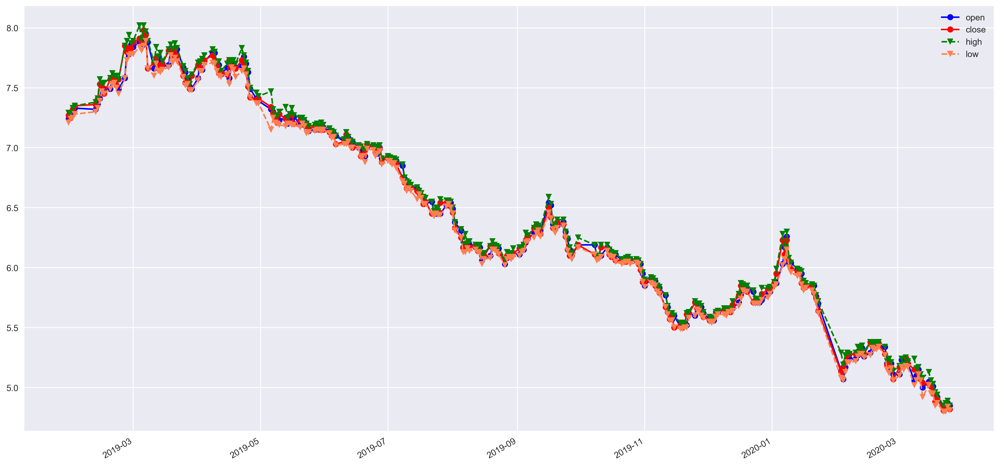

In [10]:
print_line()

## Candle Chart

In [11]:
import mpl_finance as mpf
font = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 30,
}
def print_k_line():
    for i in range(1, 11):
        
        # 创建fig对象
        fig = plt.figure(figsize=(60, 18), dpi=100, facecolor="white")

        # 设置图像边框
        fig.subplots_adjust(left=0.09, bottom=0.20, right=0.94, top=0.90, wspace=0.2, hspace=0)

        # 创建子图
        graph_KAV = fig.add_subplot(1, 1, 1)

        mpf.candlestick2_ochl(graph_KAV, table[str(i)].open, table[str(i)].close, table[str(i)].high, table[str(i)].low, width=0.5,
                              colorup='r', colordown='g') 
        if i < 10:
            title = "abc00"+str(i)
        else:
            title = "abc0"+str(i)
        graph_KAV.set_title(title, font)
        graph_KAV.set_xlabel("Date",font)
        graph_KAV.set_ylabel("Price",font)
        plt.xticks(rotation=-90)
        graph_KAV.set_xlim(0, len(table[str(i)].date))  # 设置一下x轴的范围
        graph_KAV.set_xticks(range(0, len(table[str(i)].date), 5))  # X轴刻度设定 每15天标一个日期
        graph_KAV.set_xticklabels([table[str(i)].date[index] for index in graph_KAV.get_xticks()]) 
        plt.tick_params(labelsize=23)
        plt.savefig("./candle_img/"+str(i)+".png")
        # mpf.plot(data["date", "open", "high", "low", "close", "volume"],type='candle',mav=(2, 5, 10), volume=True,show_nontrading=True)

/opt/anaconda3/lib/python3.7/site-packages/mpl_finance.py:22: DeprecationWarning: 



    Please use `mplfinance` instead (no hyphen, no underscore).

    To install: `pip install --upgrade mplfinance` 

   For more information, see: https://pypi.org/project/mplfinance/


  category=DeprecationWarning)


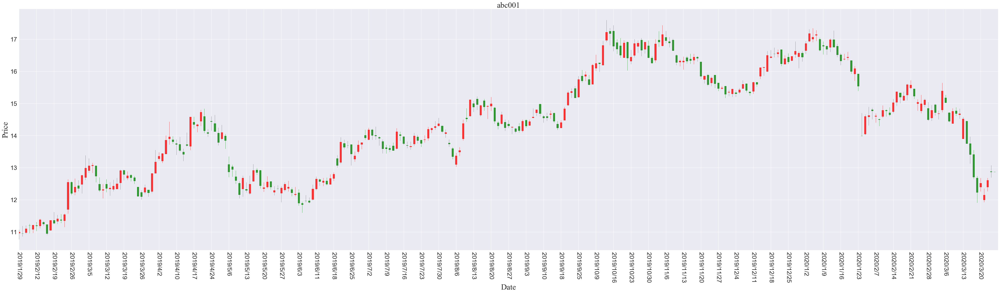

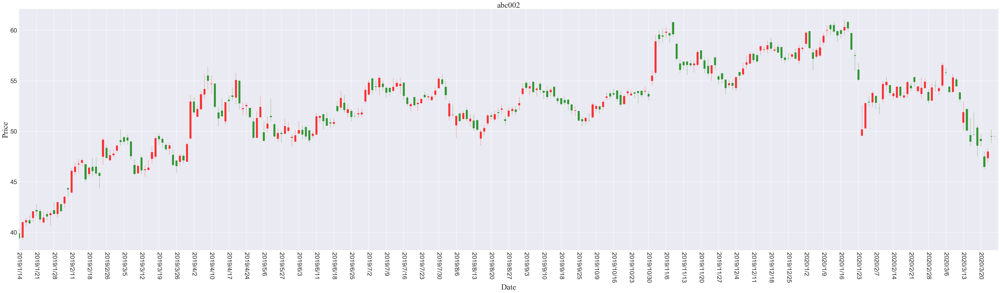

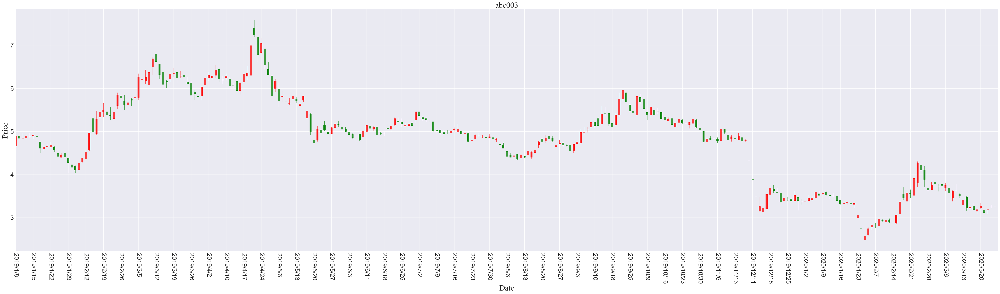

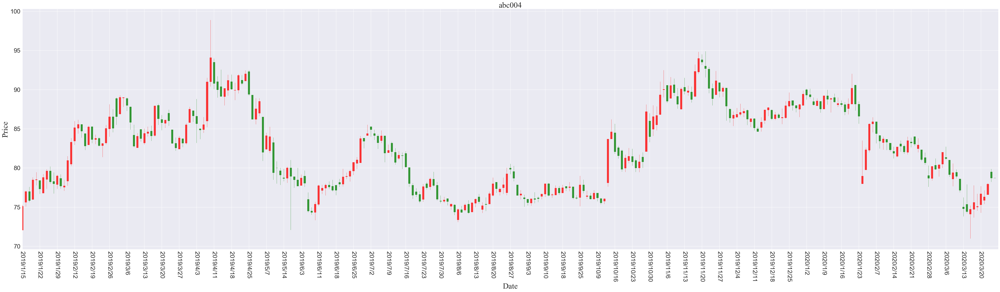

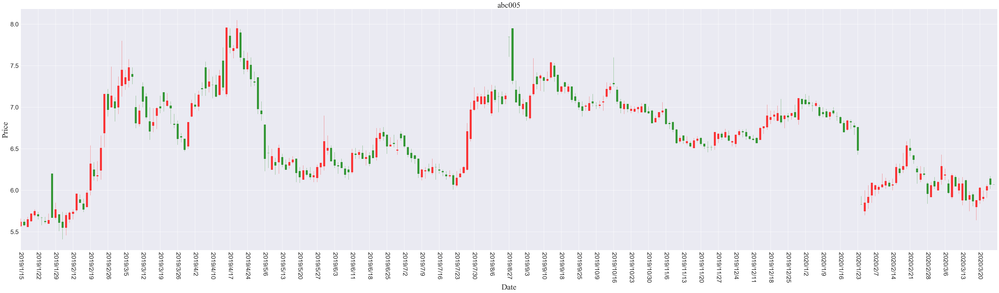

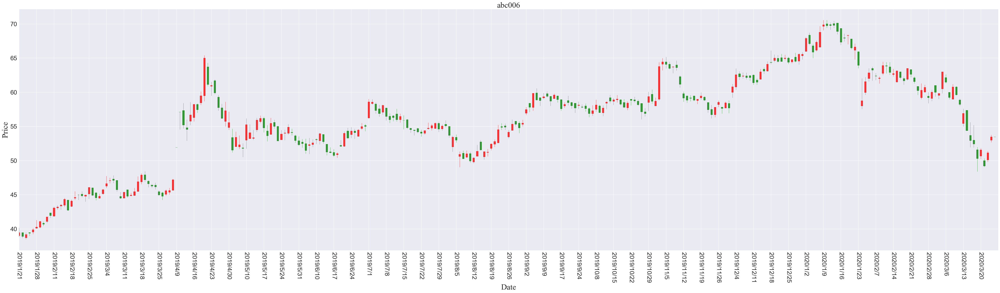

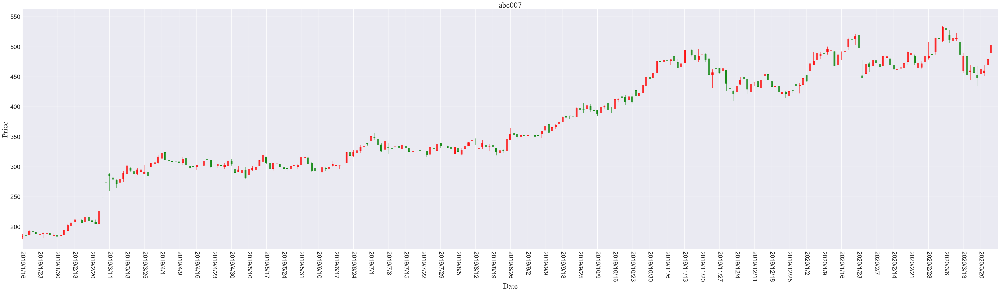

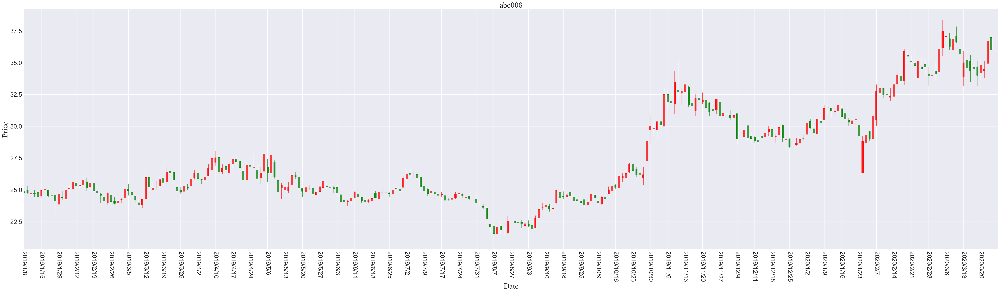

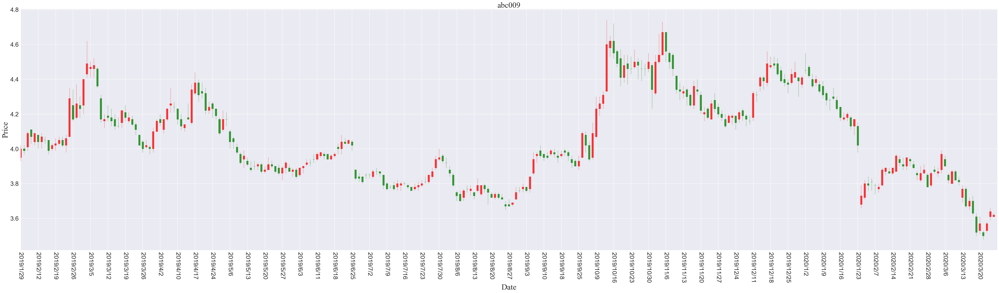

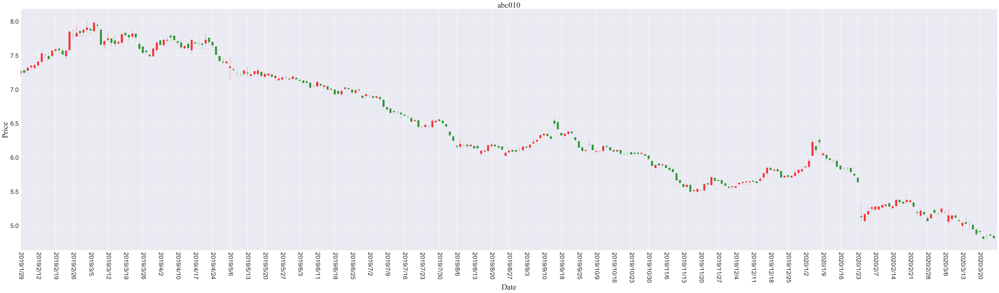

In [12]:
print_k_line()